# CTDS julia implementation

### Misc. functions

In [1]:
using DifferentialEquations
using Plots
using IJulia

function load_cnf(file_name)
    c = Nothing
    open(file_name) do file
        for (idx, line) in enumerate(eachline(file))
            if idx == 1
                N = parse(Int32, split(line, " ")[3])
                M = parse(Int32, split(line, " ")[4])
                c = zeros(M,N)
            else
                variables = split(line, " ")
                for var_str in variables
                    var = parse(Int32, var_str)
                    if var != 0
                        if var > 0
                            c[idx-1, var] = 1
                        elseif var < 0
                            c[idx-1, -var] = -1
                        end
                    end
                end
            end
        end
    end
    return c
end

function satisfied(spin_config, c)
    function check_clause(row, state)
        for (index,elem) in enumerate(row)
            if elem == state[index]
                return true
            end
        end
    end

    incorrect_flag = false
    for clause in eachrow(c)
        if check_clause(clause, spin_config) != true
            incorrect_flag = true
            break
        end
    end

    if incorrect_flag
        return false
    end
    return true
end

condition(u, t, integrator) = satisfied([s>0 ? 1 : -1 for s in u], c)
affect!(integrator) = terminate!(integrator)
cb = DiscreteCallback(condition, affect!)

DiscreteCallback{typeof(condition), typeof(affect!), typeof(SciMLBase.INITIALIZE_DEFAULT), typeof(SciMLBase.FINALIZE_DEFAULT)}(condition, affect!, SciMLBase.INITIALIZE_DEFAULT, SciMLBase.FINALIZE_DEFAULT, Bool[1, 1])

### Problem definition and initial conditions

In [2]:
c = load_cnf("SAT_problems\\Benchmark_problems_N100-250\\uf100-01.cnf")
M, N = size(c)
u0 = ones(N+M);
u0[1:N] = 2*rand(Float64, N) -ones(N);

## System of equations 1

$$
\frac{ds_i}{dt} = \sum_m^M 2 a_m c_{mi} \left(1-c_{mi}s_i\right) \frac{1}{2^{6}}\prod_{j \neq i}^N \left( 1-c_{mj}s_j\right)^2 
$$

$$
\frac{da_m}{dt} = a_m \left(-\lambda \ln a_m + \frac{1}{2^{3}}\prod_{j=1}^N  \left( 1-c_{mj}s_j\right)  \right)
$$

In [1]:
function CTDS_rule!(du, u, p, t)
    c = p[1]
    M, N = size(c)
    s = u[1:N]
    a = u[N+1:end]
    for i in 1:N 
        du[i] = sum([2*a[m]*c[m,i]*(0.125*prod([ j!=i ? (1-c[m, j]*s[j]) : 1 for j in 1:length(s)]))^2*(1-c[m, i]*s[i]) for m in 1:M])
    end
    for m in 1:M
        du[N+m] = a[m]*0.125*prod([ (1-c[m, j]*s[j]) for j in 1:N])
    end
    return nothing
end

function CTDSl_rule!(du, u, p, t)
    c = p[1]
    lmdb = p[2]
    M, N = size(c)
    s = u[1:N]
    a = u[N+1:end]
    for i in 1:N 
        du[i] = sum([2*a[m]*c[m,i]*(0.125*0.125*prod([ j!=i ? (1-c[m, j]*s[j]) : 1 for j in 1:N]))^2*(1-c[m, i]*s[i]) for m in 1:M])
    end
    for m in 1:M
        du[N+m] = a[m]*(-lmdb*log(a[m]) + 0.125*prod([ (1-c[m, j]*s[j]) for j in 1:N]))
    end
    return nothing
end



DiscreteCallback{typeof(condition), typeof(affect!), typeof(SciMLBase.INITIALIZE_DEFAULT), typeof(SciMLBase.FINALIZE_DEFAULT)}(condition, affect!, SciMLBase.INITIALIZE_DEFAULT, SciMLBase.FINALIZE_DEFAULT, Bool[1, 1])

In [7]:
p = [c, 0.001]

prob = ODEProblem(CTDSl_rule!, u0, tspan, p);
sol1 = solve(prob, callback = cb);

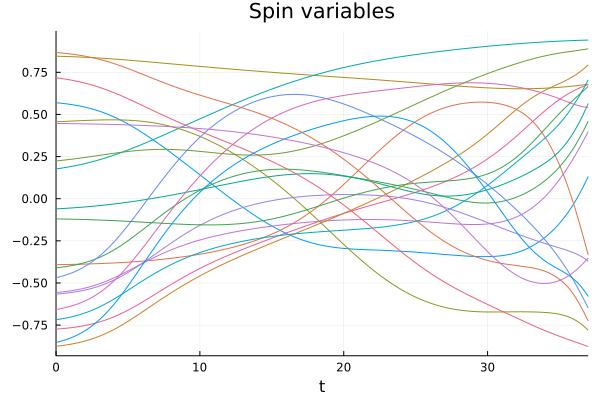

In [ ]:
plot(sol1, xaxis="t", vars=(1:N), legend=false)
title!("Spin variables")

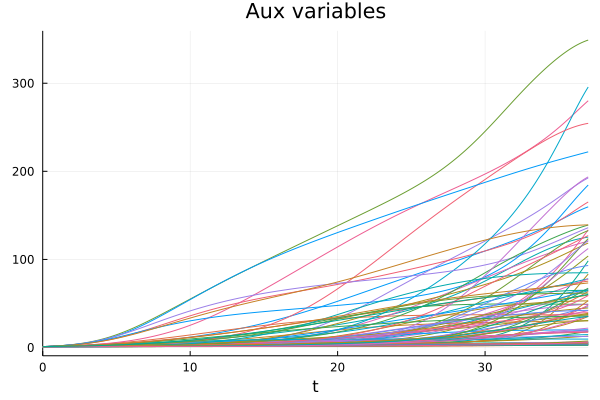

In [5]:
plot(sol1, xaxis="t", vars=(N+1:N+M), legend=false)
title!("Aux variables")

## Second system of equations

$$
\frac{ds_i}{dt} = \sum_m^M 2 e^{z_m} c_{mi} \left(1-c_{mi}s_i\right) \frac{1}{2^{6}}\prod_{j \neq i}^N \left( 1-c_{mj}s_j\right)^2 
$$

$$
\frac{dz_m}{dt} =- \lambda z_m + \prod_{j=1}^N \left( 1 - c_{mj} s_j\right) 
$$

In [3]:
function K(m, c, s)
    M, N = size(c)
    return 2^(-3) * prod([(1 - c[m, j] * s[j]) for j in 1:N])
end

function k(m, i, c, s)
    M, N = size(c)
    return 2^(-3) * prod([1.0 - c[m, j] * s[j] for j in 1:N if i != j])
end

function CTDS_z_rule!(du, u, params, t)
    """Right-hand side of the differential equation defining the system"""
    c = params[1]
    λ = params[2]
    M, N = size(c)
    s = u[1:N]
    z = u[N+1:end]

    du[1:N] = [sum(2*[exp(z[m])*c[m, i]* (1-c[m, i]*s[i]) *(k(m, i, c, s)^2) for m in 1:M]) for i in 1:N]
    du[N+1:end] = [(K(m, c, s) - λ * z[m]) for m in 1:M]
    return Nothing
end

CTDS_z_rule! (generic function with 1 method)

In [4]:
tspan = (0.0,25.0);
p2 = [c, 0.0025]

prob2 = ODEProblem(CTDS_z_rule!, u0, tspan, p2);
sol2 = solve(prob2, Tsit5(), callback = cb);

In [5]:
plot(sol2, xaxis="t", vars=(1:N), legend=false)
title!("Spin variables")

In [6]:
plot(sol2, xaxis="t", vars=(N+1:N+M), legend=false)
title!("Aux variables")